# **Lab 1: Signal Basis**

Author: Zheng Xinzhe

Slides:

Videos:

**Objectives:**
* Understand what is a signal
* Know signals from two perspectives: time domain and frequency domain
* Learn how to modify a signal from its frequency domain

If any questions, please contact the TAs via HKU moodle, or email.

Rules:
* 1) This lab consists of two parts. The first part is more like a tutorial, you don't have to do too many tasks, just fill in some code blanks marked by "YOUR CODE HERE" and "END OF YOUR CODE". The Second part is all about tasks, you need to play with the code and answer some questions. For details on how to submit answers, see the specific task.
* 2) The score corresponding to the question is indicated next to each question.

In [1]:
# Before this lab journey, please enter your name and student ID
NAME = "Kang, Zheming"
ID = "3036195746"

## 1. Introduction

In this section, we will introduce the concept of signals. We will start from the definition of signals, and then see what different signals look like.

### 1.1 What is a signal? (0.5 point)

In nature, a signal can be a sound wave, which is produced by humans, instruments, or nature phenomena. It can also be a light wave, which is produced by any light sources. It can even be actions done by an organism to alert other organisms, ranging from the release of plant chemicals to warn nearby plants of a predator.
 
In our lab, we will only focus on the signals defined in "Signal Processing" field, which is a branch of electrical and communication engineering. In short, a signal is any quantity that can vary over space or time to share messages between observers. The *IEEE Transactions on Signal Processing* includes audio, video, speech, image, sonar, and radar as examples of signal. A signal may also be defined as any observable change in a quantity over space or time, even if it does not carry information (noise signal).

We will start from the simplest case: Acoustic Wave. **Acoustic Wave** is a kind of mechanical wave, which is produced by the vibration of the vocal body and propagation in the medium. The number of cycles a sound wave vibrates per second is called the frequency and is measured in Hertz (Hz). Generally speaking, the sound wave frequency that human ear can hear is about 20 Hz to 20 kHz. The sound wave frequency above 20 kHz is called ultrasonic wave, and the sound wave below 20 Hz is called infrasonic wave.

In [2]:
# import necessary python packages
import numpy as np
import matplotlib.pyplot as plt

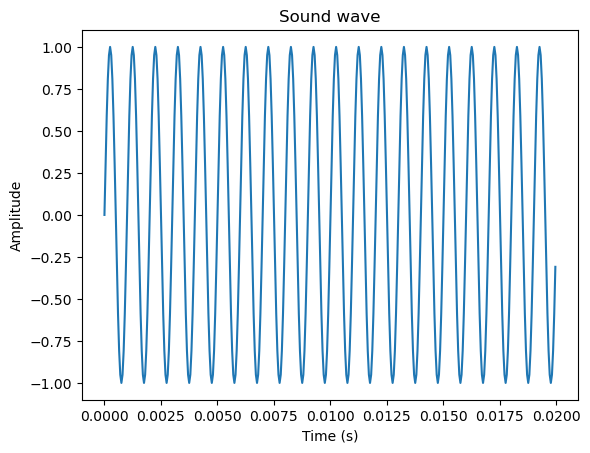

In [3]:
# Plot a sound wave whose frequency is 1kHz
# Duration is 0.02 second
# Sampling rate is 20kHz

# Sampling rate
fs = 20000
# Time stamps for 0.02 second under 20kHz sampling rate
t = np.arange(0, 0.02, 1/fs)
# Frequency of the sound wave
f = 1000
# Create a sound wave
x = np.sin(2*np.pi*f*t)

plt.plot(t, x)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Sound wave')
plt.show()

You can see from the picture that the sound wave repeats 10 times within 0.01 second. Therefore, the frequency of the sound wave is:
$$ f = \frac{10 {\rm{cycles}}}{0.01 {\rm{s}}} = 1000 \rm{Hz}$$

Let's try to play a sound wave with frequency of 1000 Hz. You can use the code below to play a sound wave with frequency of 1000 Hz. You can change the frequency to see what happens.

Just play with the code for fun.

In [4]:
# Change the settings for better sound performance
# Sampling rate
fs = 44100
# Time stamps for 2 second under 44.1kHz sampling rate
t = np.arange(0, 2, 1/fs)
# Frequency of the sound wave
#f = 1000
f = 500
# Create a sound wave
x = np.sin(2*np.pi*f*t)

# Play the sound wave
from IPython.display import Audio
Audio(x, rate=fs)

However, in nature, a signal could be composed of multiple frequency components. Based on previous knowledge, could you create a signal in the combination of frequencies of 1000, 3000, and 5000 Hz?

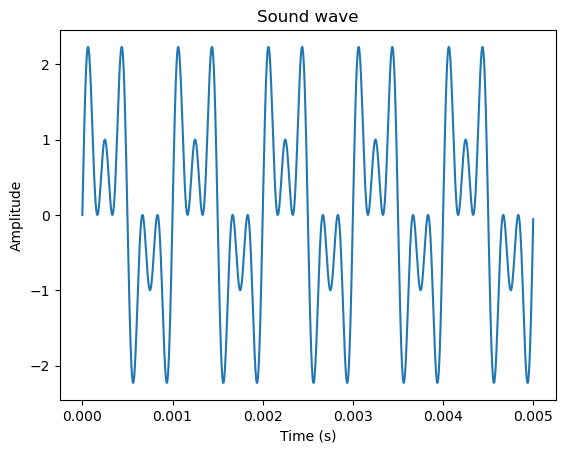

In [5]:
# YOUR CODE HERE
# Sampling rate
fs = 1e6
# Time stamps for 0.005 second under 1000kHz sampling rate
t = np.arange(0, 0.005, 1/fs)
# Frequency of the sound wave
f1 = 1000
f2 = 3000
f3 = 5000
# Create a sound wave
x = np.sin(2*np.pi*f1*t)+ np.sin(2*np.pi*f2*t) + np.sin(2*np.pi*f3*t)
# END OF YOUR CODE
plt.plot(t, x)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Sound wave')
plt.show()

In nature, a signal could be composed of multiple different frequency components. That's why you can easily recognize a piece of music played by a violin and a cello. That's also one of the reasons why you can recognize a person via his or her voice.

Let's first listen to a piece of music played by violin and cello. You can use the code below to play the music.

In [6]:
# Play the piece of music in violin version
from scipy.io import wavfile

fs, x_violin = wavfile.read('./half moon serenade violin.wav')
# The audio has two channels, we only use the first channel
Audio(x_violin[:, 0], rate=fs)

c:\Users\sygra\.conda\envs\COMP7310\lib\site-packages\ipykernel_launcher.py:4: WavFileWarning: Chunk (non-data) not understood, skipping it.
  after removing the cwd from sys.path.


In [7]:
# Play the piece of music in cello version

fs, x_cello = wavfile.read('half moon serenade cello.wav')
# The audio has two channels, we only use the first channel
Audio(x_cello[:, 0], rate=fs)

c:\Users\sygra\.conda\envs\COMP7310\lib\site-packages\ipykernel_launcher.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  This is separate from the ipykernel package so we can avoid doing imports until


It is easy to recognize the difference between the violin and cello. The violin is obviously higher pitched than the cello.

So, what is the exact difference between the violin and cello? Let's first draw the signals of the violin and cello in the time domain.

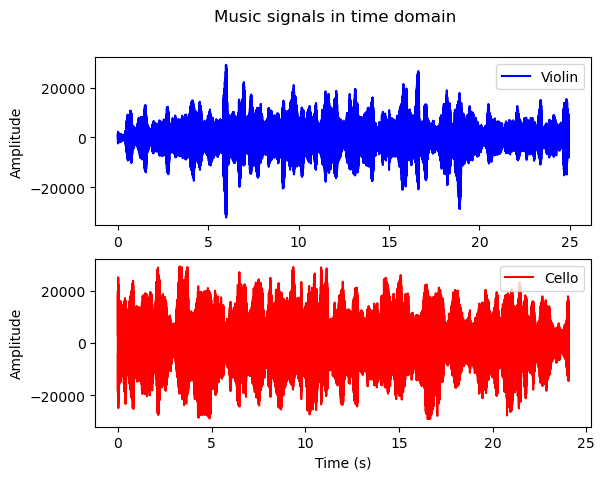

In [8]:
# Plot the signals of violin and cello in time domain
t_violin = np.arange(0, x_violin.shape[0]/fs, 1/fs)
t_cello = np.arange(0, x_cello.shape[0]/fs, 1/fs)
fig, (ax1, ax2) = plt.subplots(2)
fig.suptitle('Music signals in time domain')
ax1.plot(t_violin, x_violin[:, 0], color='blue', label='Violin')
ax1.set_ylabel('Amplitude')
ax1.legend()
ax2.plot(t_cello, x_cello[:, 0], color='red', label='Cello')
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Amplitude')
ax2.legend()

Obviously, the two signals look visually different over time (i.e., in the *time domain*). However, we cannot describe how they are exactly different, nor can we quantify how much they are different. 

As we have discussed before, a natural signal is composed of multiple frequency components, so can we examine their differences in the *frequency domain*? The answer is yes, but the problem is how can we obtain the signal's frequency responses and quantify the percentage of each frequency component in each signal? Well, we can use ***Fourier Transform*** to do that.

### 1.2 Frequency Domain (0.5 point)

In this section, you don't need to fully understand what is ***Fourier Transform***. You will learn more about it and get to understand it in our next `Lab 2`. You just need to know that ***Fourier Transform*** can decompose a signal into different frequency components. Take it as a black box for now.

The following code box is an example of how to calculate the frequency domain for the violin music signals. You can run the code to see the results.

Text(0.5, 1.0, 'Music signals in frequency domain (Violin)')

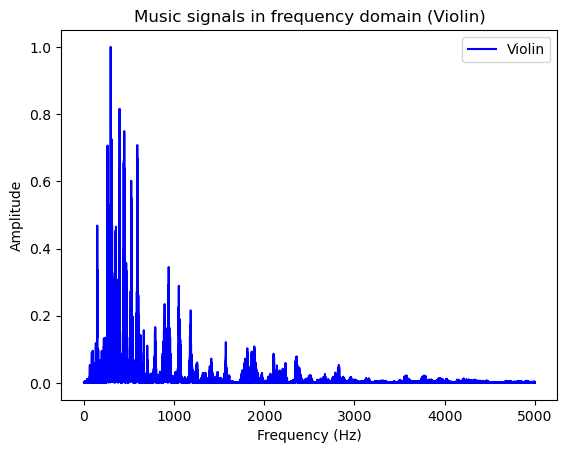

In [9]:
# Plot the signals of violin and cello in frequency domain
from scipy import fftpack

# Compute the FFT of the signals
X_violin = fftpack.fft(x_violin[:, 0])
# Compute the frequency domain
freq_violin = fftpack.fftfreq(len(X_violin)) * fs
# Convert the frequency domain to positive side and below 5000Hz
X_violin = X_violin[freq_violin > 0]
freq_violin = freq_violin[freq_violin > 0]
X_violin = X_violin[freq_violin < 5000]
freq_violin = freq_violin[freq_violin < 5000]

# Normalize the signals
X_violin = X_violin / np.max(np.abs(X_violin))

# Plot the signals in frequency domain
plt.plot(freq_violin, np.abs(X_violin), color='blue', label='Violin')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Music signals in frequency domain (Violin)')

Based on the above given example, could you calculate the frequency domain for the cello music signals?

Text(0.5, 1.0, 'Music signals in frequency domain (Cello)')

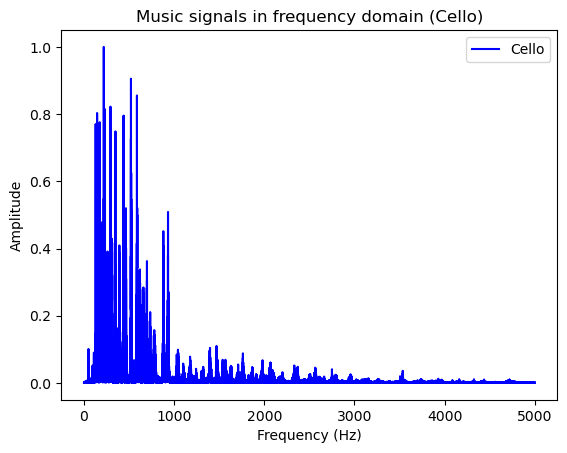

In [10]:
# YOUR CODE HERE
# Plot the signals of violin and cello in frequency domain
from scipy import fftpack

# Compute the FFT of the signals
X_cello = fftpack.fft(x_cello[:, 0])
# Compute the frequency domain
freq_cello = fftpack.fftfreq(len(X_cello)) * fs
# Convert the frequency domain to positive side and below 5000Hz
X_cello = X_cello[freq_cello > 0]
freq_cello = freq_cello[freq_cello > 0]
X_cello = X_cello[freq_cello < 5000]
freq_cello = freq_cello[freq_cello < 5000]

# Normalize the signals
X_cello = X_cello / np.max(np.abs(X_cello))
# Plot the signals in frequency domain
plt.plot(freq_cello, np.abs(X_cello), color='blue', label='Cello')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.legend()
plt.title('Music signals in frequency domain (Cello)')
# END OF YOUR CODE

Obviously, around 2000 Hz, the violin has a higher amplitude than the cello. That's why the cello sounds more cloudy.

Now you have a tool to quantify different frequency components in a signal. It could be a powerful tool in the following few tasks and classes.

### 1.3 Special Signals (0.5 point)

Let's take a detour and have a look at some special signals.

All of the signals metioned above carry certain information. However, there are also some signals that do not carry any information. They are called ***Noise Signals***, which are random.

Another special signal is ***Chirp Signal***. A ***Chirp Signal*** is a signal whose frequency increases or decreases linearly with time. It is a special case of a linear frequency modulated signal. Though you can obtain its frequency domain by ***Fourier Transform***, you cannot analyze its frequency shift in the time domain.

Let's move on and see what will happen.

#### 1.3.1 Noise Signal

In signal processing, noise is a general term for unwanted (and, in general, unknown) modifications that a signal may suffer during capture, storage, transmission, processing, or conversion. Sometimes the word is also used to mean signals that are random (unpredictable) and carry no useful information.

Let's first see an example of noise signal.

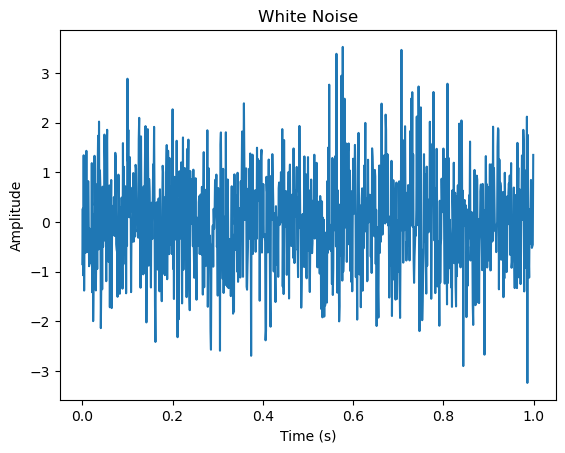

In [11]:
# Create a white noise signal (gaussian noise)
import numpy
import matplotlib.pyplot as plt

# mean value of the noise
mean = 0
# standard deviation of the noise
std = 1
fs = 1000
t = np.arange(0, 1, 1/fs)
samples = numpy.random.normal(mean, std, size=fs)

plt.plot(t, samples)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('White Noise')
plt.show()

Obviously, you cannot find a periodic pattern in the noise signal. It is just completely random. So, what will happen to its frequency domain?

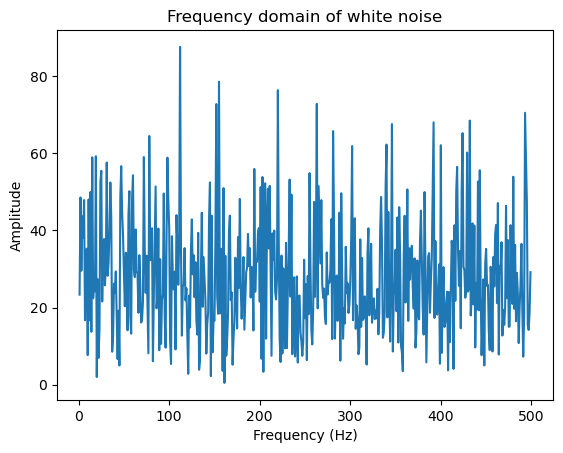

In [12]:
# Calculate the frequency domain of the white noise
X = fftpack.fft(samples)
freq = fftpack.fftfreq(len(X)) * fs
X = X[freq > 0]
freq = freq[freq > 0]

# Plot the frequency domain of the white noise
plt.plot(freq, np.abs(X))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency domain of white noise')
plt.show()

You can see from the picture that the noise signal has a lot of frequency components, and it seems that the amplitude of each frequency is very close to each other. Actually, in the ideal case, the ***Fourier Transform*** of white noise should be a flat line. If you are interested, you can search Google and find out more.

#### 1.3.2 Chirp Signal

A chirp signal is a signal whose frequency increases or decreases linearly with time. It is a special case of a linear frequency modulated signal. Here is an example of a chirp signal.

[ 1.          0.99999506  0.99998019 ... -0.98229228 -0.9921162
 -0.99802692]


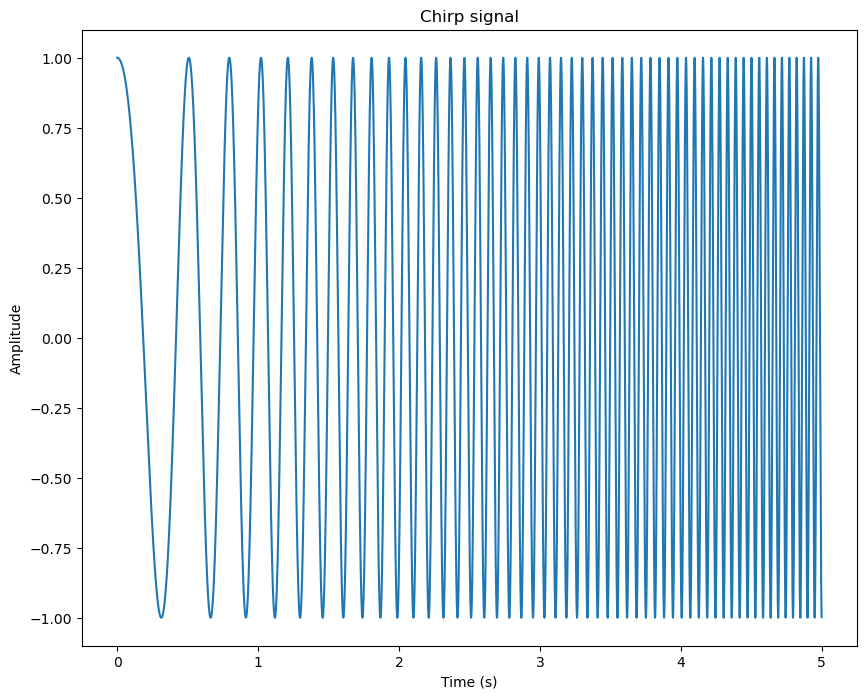

In [2]:
# generate FMCW signal
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal

# generate chirp signal
def chirp_signal(f_start, f_end, T, fs):
	t = np.arange(0, T, 1/fs)
	signal_ = signal.chirp(t, f_start, T, f_end, method='linear')
	return signal_

# generate chirp signal
# Start frequency
f_start = 1
# End frequency
f_end = 20
# Time duration
T = 5
# Sampling rate
fs = 2000
chirpsignal = chirp_signal(f_start, f_end, T, fs)
plt.figure(figsize=(10, 8))
t = np.arange(0, T, 1/fs)
plt.plot(t, chirpsignal)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Chirp signal')
plt.show()

Though you can obtain its frequency domain by ***Fourier Transform***, you cannot analyze its frequency shift (that is, how the frequency changes over time) in the time domain. During this period, the frequency of the chirp signal increases linearly from 1 Hz to 20 Hz. As a result, the frequency domain of the chirp signal should contain frequency components from 1 Hz to 20 Hz. Let's see if it's true after ***Fourier Transform***. Please fill in the code box below to calculate the frequency domain of the chirp signal.

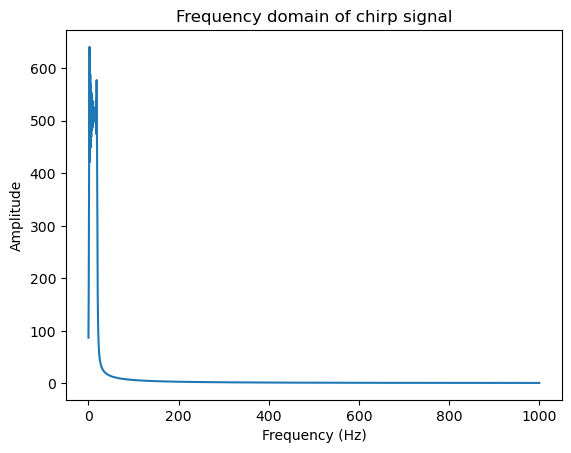

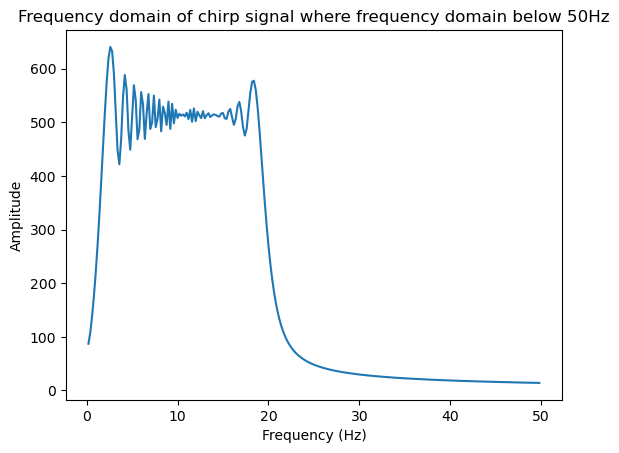

In [14]:
# YOUR CODE HERE
# Calculate the frequency domain of the chirp signal
chirp_freq = fftpack.fft(chirpsignal)
freq = fftpack.fftfreq(len(chirp_freq)) * fs
chirp_freq = chirp_freq[freq > 0]
freq = freq[freq > 0]

# Plot the frequency domain of the chirp signal
plt.plot(freq, np.abs(chirp_freq))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency domain of chirp signal')
plt.show()

# Focus on the frequency domain below 50Hz
chirp_freq = chirp_freq[freq<50]
freq = freq[freq < 50]

# Visualize the frequency domain below 50Hz
plt.plot(freq, np.abs(chirp_freq))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency domain of chirp signal where frequency domain below 50Hz')
plt.show()
# END OF YOUR CODE

The result is as expected. The frequency domain of the chirp signal contains frequency components from 1 Hz to 20 Hz. But it cannot tell you the frequency shift in the time domain. So, we need a more powerful tool to analyze the chirp signal, and it is called ***Short Time Fourier Transform***. The time series of the chirp signal will be seperated into several small segments, and ***Fourier Transform*** will be applied to each segment. Then, the frequency domain of each segment will be plotted in the time domain.

You can just take STFT as a combinition of multiple Fourier Transforms. We will give a more comprehensive explanation of STFT in the following lab.

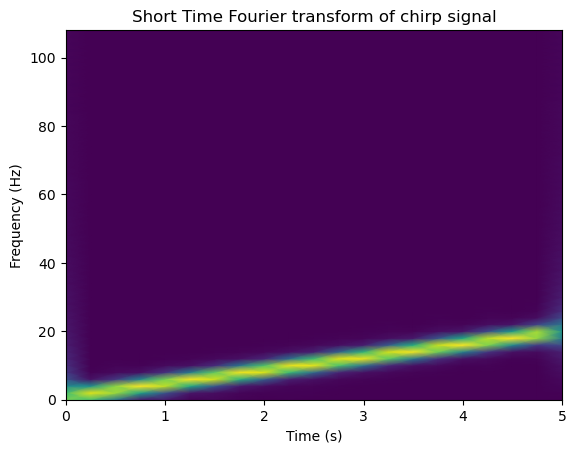

In [15]:
# Short Time Fourier transform of chirp signal
from scipy import signal
import matplotlib.pyplot as plt

# nperseg: number of samples per segment
f, t, Zxx = signal.stft(chirpsignal, fs, nperseg=1000)

plt.pcolormesh(t, f[:55], np.abs(Zxx)[:55, :], shading='gouraud')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Short Time Fourier transform of chirp signal')
plt.show()

The output result of ***Short Time Fourier Transform*** can nicely reflect the frequency shift in the time domain. You can see that the frequency of the chirp signal increases linearly from 1 Hz to 20 Hz.

## 2. Task: Manipulate Signal Frequency (3.5 points)

With the above introduction (and your hands-on practice), you should have a basic understanding of signals. Now, let's try to solve some tasks by yourselves.

### 2.1 Analyze Frequency Components (1.5 points)

In this task, you need to use what you have learned from section one to analyze signals. You can select some open data online, for example, weather data (like hourly rainfall during the blain rain in HK last Friday), stock data, or any other data you are interested in. Then, you need to analyze the frequency components of the selected data, and give a brief analysis based on your results. You can share some of your findings in markdown format. It's an open task for you.

Note: You don't need to download "big data" for this task. Just fetch a small amount of data sufficient for your analysis. 

**Scoring Rubric**:
* 1) Select data and analyze frequency components (1 point)
* 2) Give a brief analysis based on your results (0.5 point)

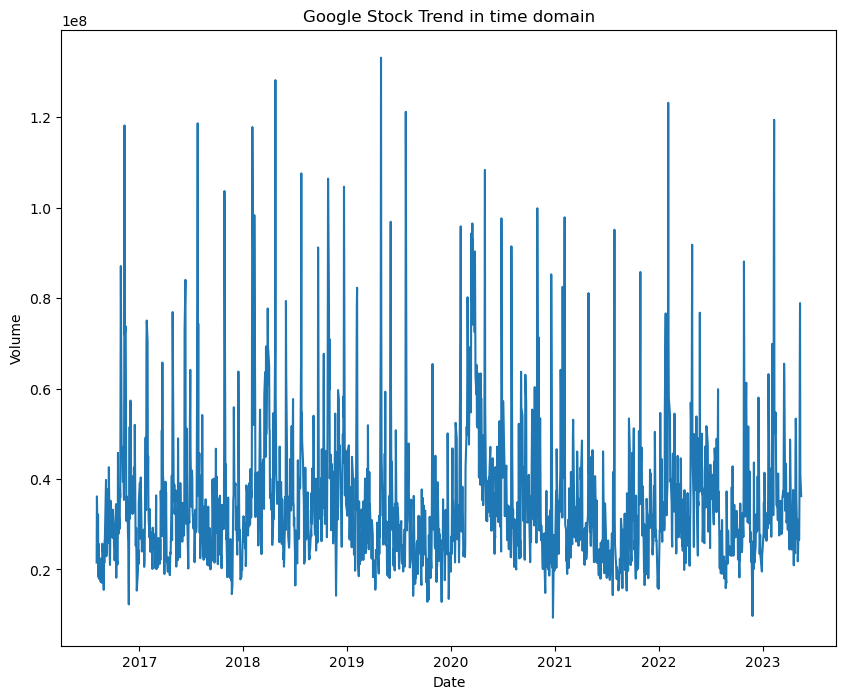

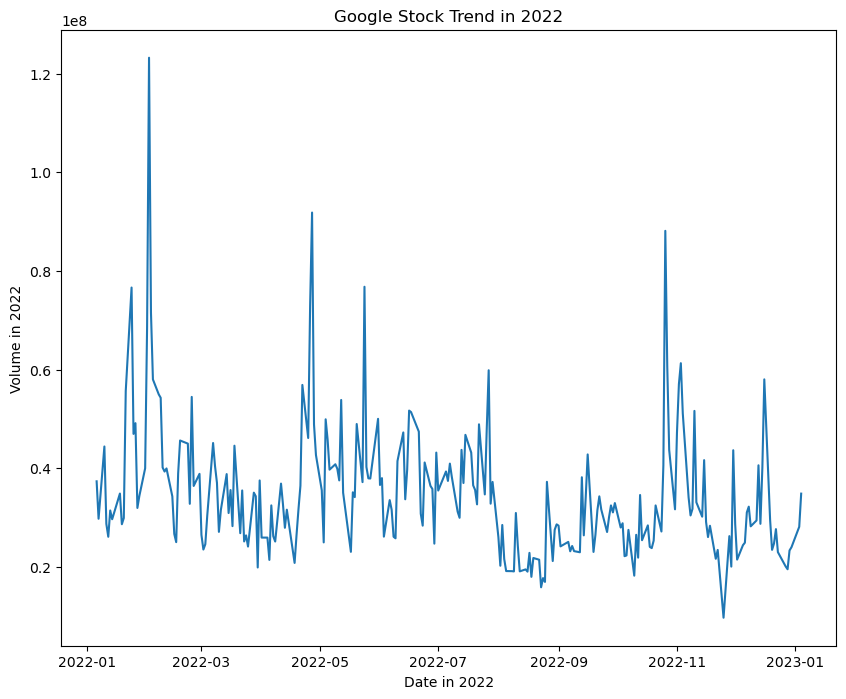

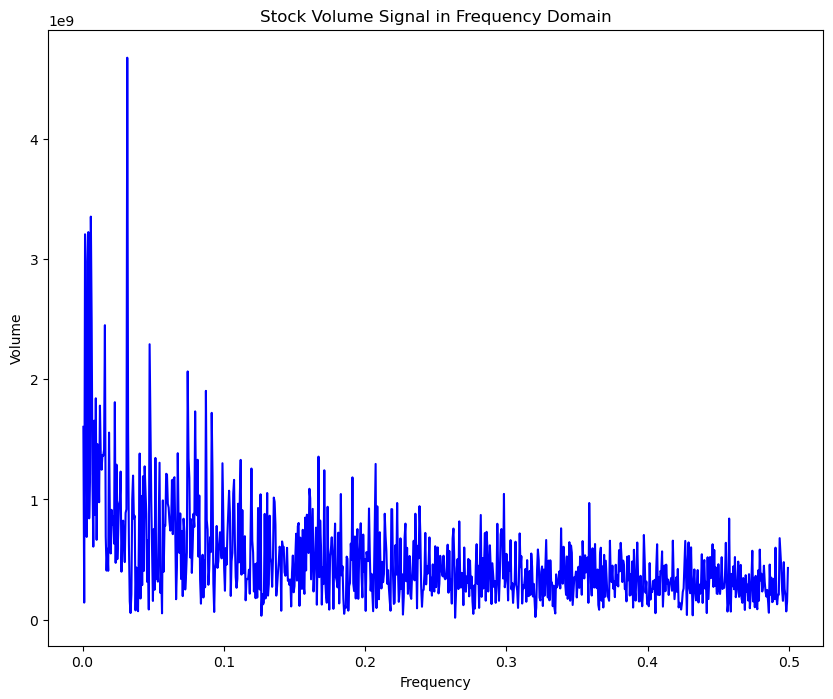

In [16]:
# YOUR CODE HERE
import csv
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np
filename = "GOOGLE.csv"
volume = []
date = []
with open(filename, "r") as file:
    reader = csv.DictReader(file)
    next(reader)
    for row in reader:
        volume.append(row["Volume"])
        date.append(row["Date"])
    # print("date", date)
    # print("volume", volume)
# plot in time domain
plt.figure(figsize=(10, 8))
# get data from 3010 to the end, time period should be like [2016, 2023]
one_year_date = date[4376:4626]
date = date[3010:]
date = [datetime.strptime(d, "%Y-%m-%d") for d in date]
one_year_date = [datetime.strptime(d, "%Y-%m-%d") for d in one_year_date]
one_year_vol = volume[4376:4626]
volume = volume[3010:]
volume = [int(v) for v in volume]
one_year_vol = [int(v) for v in one_year_vol]
plt.plot(date, volume)
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Google Stock Trend in time domain')
plt.show()
plt.figure(figsize=(10, 8))
plt.plot(one_year_date, one_year_vol)
plt.xlabel('Date in 2022')
plt.ylabel('Volume in 2022')
plt.title('Google Stock Trend in 2022')
plt.show()
# get frequency components
from scipy import fftpack
# Convert volume to numpy array
volume = np.array(volume)
# Compute the FFT of the volume signal
X_volume = fftpack.fft(volume)
# Compute the frequency domain
freq_volume = fftpack.fftfreq(len(X_volume))
# Convert the frequency domain to positive side
X_volume = X_volume[freq_volume > 0]
freq_volume = freq_volume[freq_volume > 0]
# Plot the signals in frequency domain
# print(np.max(freq_volume))
plt.figure(figsize=(10, 8))
plt.plot(freq_volume, np.abs(X_volume), color='blue')
plt.xlabel('Frequency')
plt.ylabel('Volume')
plt.title('Stock Volume Signal in Frequency Domain')
plt.show()

# END OF YOUR CODE

In this task, I found google stock data from Kaggle. https://www.kaggle.com/datasets/bilalwaseer/google-stocks-complete </br>
Firstly, I slip them from Aug,2016 to now. </br>Then, I plot the relation between volume and time. For details, I also plot the trend in 2022.</br> Finally I use FFT to see the frequency from Aug, 2016 to now.</br>
Here are some findings:
1. The volume is decreasing when the frequency is increasing, which means small volume is more common than great transactions in google stock trend.
2. From the frequency figure, we can see only a few volume is much higher than others, which means most of the transactions are small.
3. From 2, we can infer that there may be a major shareholder influencing the Google stock market, while the majority of participants consist of retail investors freely trading in the market.
4. Perhaps on certain specific days, there is a significant increase in trading activity for Google stock, resulting in high trading volumes occurring at lower frequencies.
5. Interesting facts: It is possible that we can observe three peaks of high trading volumes in the time-domain signal for the year 2022. Taking into consideration that schools in the world typically have three quarters, there might be a surge in Google usage by students after entering formal academic life(just like us! In the United States, students will focusing on assignments around October, February, and June). This could potentially be a reason of these three peaks. Student visit Google-> Google gets more investment-> Stock volume increase. Just a funny assumption.


### 2.2 Music Flat (2 points)

Jack loves music very much, and he has a lot of music files in his computer. However, one day, he found that one of his music files was six notes higher than the original one. He asked you for help. Could you help him to restore the original music file?

**Here is the supplementary information for this task.**
The figure below shows the 88 keys of the piano, containing 7 full octaves. An octave contains 12 keys, consisting of 7 white keys and 5 black keys. Seven white keys, C D E F G A B in phonetic name, Do Re Mi Fa Sol La Ti. The five black keys, represented by the adjacent white keys ascending or descending, C♯, D♯, F♯, G♯, A♯, pronounced C sharp, D sharp, and so on. Or D♭, E♭, G♭, A♭, B♭, pronounced D flat, E Flat, and so on.

An octave is defined as： 
* 1) A key in the latter octave is twice the frequency of the corresponding key in the previous octave, for example C4 (261.63Hz) is twice the frequency of C3 (130.81Hz) and A4 (440Hz) is twice the frequency of A3 (220Hz).
* 2) Within an octave, the ratio of the frequency of two adjacent keys are constant value, that is, 12 key frequencies are geometric series, and the ratio $q$ is the $12^{th}$ root of $2$ ($q=\sqrt[12]{2}=1.0594$). For example, $C♯4/C4==1.0594$.

![Piano](https://img-blog.csdnimg.cn/dcd2b9a117e24f9284a2797a9dcc959e.png?x-oss-process=image/watermark,type_d3F5LXplbmhlaQ,shadow_50,text_Q1NETiBAU29waGlhUmVhZGluZw==,size_20,color_FFFFFF,t_70,g_se,x_16 "Piano")

**Hint:**
* 1) Figure our what it means to be six notes higher, that is to say, you need to reduce the frequency band of the music file with the ratio of $q^6=\sqrt{2}$.
* 2) You can transfer the music file to frequency domain, and change the frequency components according to the materials above.

**Scoring Rubric**:
* 1) Plot the frequency domain of the music file with six notes higher (0.5 point)
* 2) Use STFT to plot the frequency components in each time window (0.5 point)
* 3) Move the frequency components in each time window to the original frequency band (0.5 point)
* 4) Restore the music file, save it as a wav file, and test it. (0.5 point)

It should be noticed that you cannot just move the whole frequency band of the music file with the ratio of $q^6=\sqrt{2}$, as the reconstructed music file will be really strange. As the frequency band movement can somehow distort the time order of the music file.
By using STFT, if the time window only contains few tones and these tones last in the whole time window, the movement of the frequency band will not distort the time order of the music file.
You can try to move the whole frequency band and see what will happen.

In [17]:
# Load wav file
import librosa
import librosa.display
import scipy.io.wavfile as wav


"""
Params:
y: music sequence
sr: sampling rate
"""
y, sr = librosa.load('Dandelion\'s Promise_rise.wav')
from IPython.display import Audio
Audio(y ,rate=sr)

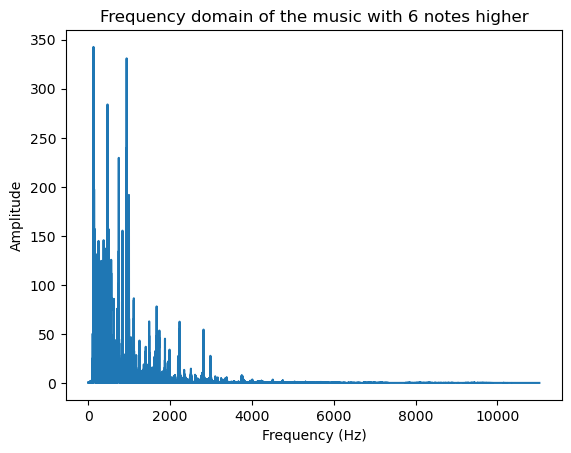

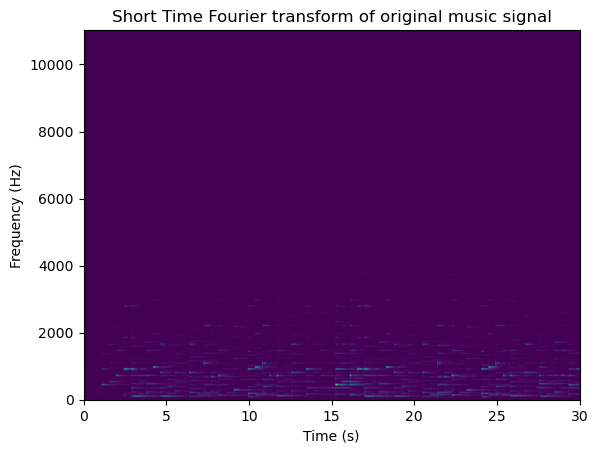

In [18]:
"""
Your answer here:
Please save the answer in wav file.
"""
import soundfile as sf
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
from scipy import fftpack
# YOUR CODE HERE
# Question 1. Plot the frequency domain of the music file with six notes higher (0.5 point)
y_freq = fftpack.fft(y)
freq = fftpack.fftfreq(len(y_freq)) * sr
y_freq = y_freq[freq > 0]
freq = freq[freq > 0]
# Plot the frequency domain
plt.plot(freq, np.abs(y_freq))
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.title('Frequency domain of the music with 6 notes higher')
plt.show()
# print(sr)
# Q2. Use STFT to plot the frequency components in each time window (0.5 point)
# nperseg = int(sr*0.05)+1
nperseg = 1000
# print(nperseg)
# sr = 22050, time window = 0.05s
# nperseg = 22050(Hz) * 0.05(s) = 1102.5
f, t, Zxx = signal.stft(y, fs=sr, nperseg=nperseg)
# print(np.max(f))
plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Short Time Fourier transform of original music signal')
plt.show()



In [19]:
# Q3. Move the frequency components in each time window to the original frequency band (0.5 point)
# move f to 6 notes lower
# f: Array of sample frequencies
# Zxx: STFT of x
f_ = f
Zxx_ = Zxx
q = np.sqrt(2)

print("f_ size is ", f_.size)
for i in range(len(f_)):
    f_new = f_[i]/q
    idx_positive = np.argmin(np.abs(f-f_new))
    idx_negative = np.argmin(np.abs(f+f_new))
    Zxx[idx_positive] = Zxx[f==f_[i]]
    # print("Zxx[idx_neg] shape is ", Zxx[idx_negative].shape)
    # print("Zxx[-f_[i]] shape is ", Zxx[f==-f_[i]].shape)
    # Zxx[idx_negative] = Zxx[f==-f_[i]]
    Zxx[f==f_[i]]=0
    # Zxx[f==-f_[i]]=0
Zxx_ = Zxx[f>=0]
f_ = f[f>=0]
t_, y_ = signal.istft(Zxx)
Audio(y_, rate = sr)


# Q4. Restore the music file, save it as a wav file, and test it. (0.5 point)



# END OF YOUR CODE

# # Store wav file
NAME = "KangZheming"
ID = "3036195746"
write_wav_path = NAME + "_" + ID + "_" + "music.wav"

# # Output data
outdata = y_
# Sampling rate
samprate = sr
sf.write(write_wav_path, outdata, samprate, 'PCM_16')

f_ size is  501


In [20]:
import soundfile as sf
import numpy as np
# I DONT HAVE SUCH MUSIC FILE!
# outdata, samprate = sf.read("/home/aiot/Documents/github/HKU-COMP7310-AIOT/Lab01/Dandelion's Promise_rise_shift.wav")
Audio(outdata, rate=samprate)

#### Test your results

In [21]:
from scipy import fftpack
# Select the first second of the music
y = y[:sr]
y_lower, sr_lower = outdata, samprate
y_lower = y_lower[:sr_lower]
# Use FFT to calculate the frequency domain
Y = fftpack.fft(y)
freq = fftpack.fftfreq(len(Y)) * sr
Y_lower = fftpack.fft(y_lower)
freq_lower = fftpack.fftfreq(len(Y_lower)) * sr_lower
# select the frequency component with the maximum amplitude
Y_index = np.argmax(np.abs(Y))
Y_lower_index = np.argmax(np.abs(Y_lower))
Y_note = librosa.hz_to_note(freq[Y_index])
Y_lower_note = librosa.hz_to_note(freq_lower[Y_lower_index])
print("Original audio tonality:", Y_note)
print("Lowered audio tonality:", Y_lower_note)

Original audio tonality: F♯5
Lowered audio tonality: C5


If you are doing the right thing, you will receive:
```
Original audio tonality: F♯5
Lower pitch audio tonality: C5
```